In [1]:
import matplotlib.pyplot

In [2]:
import pickle
import time
import numpy as np
import operator
import argparse
import copy
import os
import math
import glob
from collections import Counter, defaultdict
import pandas as pd

def Uncertainty_Cal(bag, is_organ=False):
    """
    Implementation of Weighted-Uncertainty-Cal in the paper.
    Input:
        bag (list): A list of dictionary which contain the searhc results for each mosaic
    Output:
        ent (float): The entropy of the mosaic retrieval results
        label_count (dict): The diagnois and the corresponding weight for each mosaic
        hamming_dist (list): A list of hamming distance between the input mosaic and the result
    """
    if len(bag) >= 1:
        label = []
        hamming_dist = []
        label_count = defaultdict(float)
        for bres in bag:
            if is_organ:
                label.append(bres['site'])
            else:
                label.append(bres['diagnosis'])
            hamming_dist.append(bres['hamming_dist'])

        # Counting the diagnoiss by weigted count
        # If the count is less than 1, round to 1
        for lb_idx, lb in enumerate(label):
            label_count[lb] += (1. / (lb_idx + 1)) * weight[lb]
        for k, v in label_count.items():
            if v < 1.0:
                v = 1.0
            else:
                label_count[k] = v

        # Normalizing the count to [0,1] for entropy calculation
        total = 0
        ent = 0
        for v in label_count.values():
            total += v
        for k in label_count.keys():
            label_count[k] = label_count[k] / total
        for v in label_count.values():
            ent += (-v * np.log2(v))
        return ent, label_count, hamming_dist
    else:
        return None, None, None


def Clean(len_info, bag_summary):
    """
    Implementation of Clean in the paper
    Input:
        len_info (list): The length of retrieval results for each mosaic
        bag_summary (list): A list that contains the positional index of mosaic,
        entropy, the hamming distance list, and the length of retrieval results
    Output:
        bag_summary (list): The same format as input one but without low quality result
        (i.e, result with large hamming distance)
        top5_hamming_distance (float): The mean of average hamming distance in top 5
        retrival results of all mosaics
    """
    LOW_FREQ_THRSH = 3
    LOW_PRECENT_THRSH = 5
    HIGH_PERCENT_THRSH = 95
    len_info = [b[-1] for b in bag_summary]
    if len(set(len_info)) <= LOW_FREQ_THRSH:
        pass
    else:
        bag_summary = [b for b in bag_summary if b[-1]
                       > np.percentile(len_info, LOW_PRECENT_THRSH)
                       and b[-1] < np.percentile(len_info, HIGH_PERCENT_THRSH)]

    # Remove the mosaic if its top5 mean hammign distance is bigger than average
    top5_hamming_dist = np.mean([np.mean(b[2][0:5]) for b in bag_summary])

    bag_summary = sorted(bag_summary, key=lambda x: (x[1]))  # sort by certainty
    bag_summary = [b for b in bag_summary if np.mean(b[2][0:5]) <= top5_hamming_dist]
    return bag_summary, top5_hamming_dist


def Filtered_BY_Prediction(bag_summary, label_count_summary):
    """
    Implementation of Filtered_By_Prediction in the paper
    Input:
        bag_summary (list): The same as the output from Clean
        label_count_summary (dict): The dictionary storing the diagnosis occurrence 
        of the retrieval result in each mosaic
    Output:
        bag_removed: The index (positional) of moaic that should not be considered 
        among the top5
    """
    voting_board = defaultdict(float)
    for b in bag_summary[0:5]:
        bag_index = b[0]
        for k, v in label_count_summary[bag_index].items():
            voting_board[k] += v
    final_vote_candidates = sorted(voting_board.items(), key=lambda x: -x[1])
    fv_pointer = 0
    while True:
        final_vote = final_vote_candidates[fv_pointer][0]
        bag_removed = {}
        for b in bag_summary[0:5]:
            bag_index = b[0]
            max_vote = max(label_count_summary[bag_index].items(), key=operator.itemgetter(1))[0]
            if max_vote != final_vote:
                bag_removed[bag_index] = 1
        if len(bag_removed) != len(bag_summary[0:5]):
            break
        else:
            fv_pointer += 1
    return bag_removed

In [3]:
class Args(object):
    def __init__(self):
        self.result_path = "./QUERY_RESULTS/all/results.pkl"
        self.csv_path = "./QUERY_RESULTS/all/summary.csv"
        self.site = 'all'

args = Args()
        
# Load the result file and corresponding slide's diagnosis label
with open(args.result_path, 'rb') as handle:
    results = pickle.load(handle)

# Count the number of slide in each diagnosis (organ)
if args.site == 'organ':
    topK_mMV = 10
    type_of_diagnosis = [os.path.basename(e) for e in glob.glob("./DATA/LATENT/*")]
else:
    topK_mMV = 5
    type_of_diagnosis = [os.path.basename(e) for e in glob.glob("./DATA/LATENT/{}/*"
                         .format(args.site))]
total_slide = {k: 0 for k in type_of_diagnosis}
for k, v in results.items():
    total_slide[v['label_query']] += 1

# Using the inverse count as a weight for each diagnosis
sum_inv = 0
for v in total_slide.values():
    if v:
        sum_inv += (1./v)

# Set a parameter k  to make the weight sum to k (k = 10, here)
if args.site == 'organ':
    norm_fact = 30 / sum_inv
else:
    norm_fact = 10 / sum_inv

weight = {}
for k,v in total_slide.items():
    if v:
        weight[k] = norm_fact * 1./v
    else:
        weight[k] = norm_fact

#weight = {k: norm_fact * 1./v for k, v in total_slide.items()}

metric_dict = {k: {'Acc': 0, 'Percision': 0, 'total_slide': 0}
               for k in weight.keys()}
bag_for_ret = {k: {} for k in weight.keys()}
t_start = time.time()

summary_df = pd.DataFrame()

In [4]:
test_slide

NameError: name 'test_slide' is not defined

In [5]:
# Evaluating the result diagnosis by diagnosis
all_results = {}
for evlb in weight.keys():
    eval_label = evlb
    print(evlb)
    corr = 0
    percision = 0
    avg_percision = 0
    count = 0
    for test_slide in results.keys():
        test_slide_result = results[test_slide]['results']
        label_query = results[test_slide]['label_query']
        if label_query != eval_label:
            continue
        else:
            # Filter out complete failure case (i.e.,
            # All mosaics fail to retrieve a patch that meet the criteria)
            ttlen = 0
            for tt in test_slide_result:
                ttlen += len(tt)
            if ttlen == 0:
                count += 1
                continue
            bag_result = []
            bag_summary = []
            len_info = []
            label_count_summary = {}
#             try:
            for idx, bag in enumerate(test_slide_result):
                if args.site == 'organ':
                    ent, label_cnt, dist = Uncertainty_Cal(bag, is_organ=True)
                else:
                    ent, label_cnt, dist = Uncertainty_Cal(bag)
                if ent is not None:
                    label_count_summary[idx] = label_cnt
                    bag_summary.append((idx, ent, dist, len(bag)))
                    len_info.append(len(bag))
#             except KeyError as e:
#                 print(e)
#                 continue
        
        bag_summary_dirty = copy.deepcopy(bag_summary)
        ##The bag_summary here is sorted by certainty
        #This means that we pick slides below based only on the query mosiac
        #that has highest certainty. Perhaps basing it on one mosiac isn't a good idea?
        #What if only that single mosiac has very high similarity, and the rest is totally different?
        bag_summary, hamming_thrsh = Clean(len_info, bag_summary)
        bag_removed = Filtered_BY_Prediction(bag_summary, label_count_summary)

        # Process to calculate the final ret slide
        ret_final = []
        visited = {}

        for b in bag_summary:
            bag_index = b[0]
            uncertainty = b[1]
            res = results[test_slide]['results'][bag_index]
            for r in res:
                if uncertainty == 0:
                    if r['slide_name'] not in visited:
                        if args.site == 'organ':
                            ret_final.append((r['slide_name'], r['hamming_dist'],
                                              r['site'], uncertainty,
                                              bag_index, r['query_slide'], r['query_coords'], (r['x'], r['y'])))
                        else:
                            ret_final.append((r['slide_name'], r['hamming_dist'],
                                              r['diagnosis'], uncertainty,
                                              bag_index, r['query_slide'], r['query_coords'], (r['x'], r['y'])))
                        visited[r['slide_name']] = 1
                else:
                    if (r['hamming_dist'] <= hamming_thrsh) and\
                       (r['slide_name'] not in visited):
                        if args.site == 'organ':
                            ret_final.append((r['slide_name'], r['hamming_dist'],
                                              r['site'], uncertainty,
                                              bag_index, r['query_slide'], r['query_coords'], (r['x'], r['y'])))
                        else:
                            ret_final.append((r['slide_name'], r['hamming_dist'],
                                              r['diagnosis'], uncertainty,
                                              bag_index, r['query_slide'], r['query_coords'], (r['x'], r['y'])))
                        visited[r['slide_name']] = 1

        #print(ret_final)
        ret_final_tmp = [e for e in
                         sorted(ret_final, key=lambda x: (x[3], x[1]))
                         if e[-4] not in bag_removed][0:topK_mMV]

        ret_final_ = [e[0] for e in
                     sorted(ret_final, key=lambda x: (x[3], x[1]))
                     if e[-4] not in bag_removed][0:topK_mMV]

        ret_final = [e[2] for e in
                     sorted(ret_final, key=lambda x: (x[3], x[1]))
                     if e[-4] not in bag_removed][0:topK_mMV]

        print("test slide", test_slide)
        print(ret_final_tmp)
        all_results[test_slide] = ret_final_tmp

OS
test slide 6744__
[('5673__', 54, 'OS', 0.0, 0, '6744__', array([78996, 27686]), (55280, 17095)), ('5674__', 72, 'OS', 0.0, 42, '6744__', array([56932, 25728]), (15900, 27548)), ('6765__', 80, 'OS', 0.0, 25, '6744__', array([19470, 32524]), (40518, 23423)), ('11576__', 81, 'OS', 0.0, 33, '6744__', array([17223, 28736]), (15053, 43830)), ('11524__', 86, 'NB', 0.0, 43, '6744__', array([78565, 38304]), (18546, 31776))]
test slide 11576__
[('11489__', 65, 'NB', 0.0, 19, '11576__', array([37917,  8786]), (90030, 57647)), ('6765__', 74, 'OS', 0.0, 2, '11576__', array([40327, 16832]), (20353, 3327)), ('8109_', 76, 'RMS_E', 0.0, 28, '11576__', array([15316, 63365]), (13162, 18602)), ('6744__', 81, 'OS', 0.0, 13, '11576__', array([15053, 43830]), (17223, 28736)), ('6947_', 82, 'RMS_E', 0.0, 83, '11576__', array([12811, 47048]), (63854, 50523))]
test slide 5689__
[('11505__', 80, 'NB', 0.0, 23, '5689__', array([81741, 65348]), (60003, 13063)), ('11474__', 83, 'NB', 0.0, 69, '5689__', array([2

test slide 9804__
[('6260_', 46, 'RMS_A', 0.0, 176, '9804__', array([75776, 90122]), (62464, 88808)), ('9811__', 52, 'EWS', 0.0, 175, '9804__', array([72704, 90122]), (69632, 84736)), ('6258_', 65, 'RMS_A', 0.0, 99, '9804__', array([66727, 85326]), (61342, 24439)), ('6253_', 69, 'RMS_E', 0.0, 14, '9804__', array([32864, 61445]), (83885, 27401)), ('7457__', 70, 'EWS', 0.0, 86, '9804__', array([76451, 80702]), (61822, 27199))]
test slide 7436__
[('5259__', 61, 'NB', 0.0, 16, '7436__', array([80596, 31396]), (38140, 57087)), ('6810_', 66, 'RMS_E', 0.0, 141, '7436__', array([83660, 20563]), (46593, 47264)), ('9829__', 67, 'EWS', 0.0, 68, '7436__', array([69369, 30059]), (36722, 56829)), ('11485__', 68, 'NB', 0.0, 9, '7436__', array([69440, 35360]), (23069, 48132)), ('11468__', 72, 'NB', 0.0, 70, '7436__', array([17433, 23922]), (16219, 6290))]
test slide 9817__
[('9852__', 60, 'EWS', 0.0, 24, '9817__', array([34096, 27474]), (20542, 42346)), ('6231_', 79, 'RMS_S', 0.0, 25, '9817__', array(

test slide 11458__
[('8099_', 50, 'RMS_E', 0.0, 24, '11458__', array([68855, 24369]), (6552, 25404)), ('11471__', 54, 'NB', 0.0, 112, '11458__', array([64810, 60867]), (46214, 39865)), ('11455__', 62, 'NB', 0.0, 248, '11458__', array([65504, 71008]), (50091, 11968)), ('10261__', 64, 'NB', 0.0, 15, '11458__', array([39855, 13127]), (24876, 49808)), ('6186_', 64, 'RMS_E', 0.0, 22, '11458__', array([15327,  5301]), (19037, 5843))]
test slide 10283__
[('11473__', 62, 'NB', 0.0, 35, '10283__', array([103009,  48992]), (46173, 50962)), ('11487__', 68, 'NB', 0.0, 1, '10283__', array([52918, 11959]), (35873, 51241)), ('10257__', 69, 'NB', 0.0, 4, '10283__', array([97094, 47162]), (36021, 21973)), ('11498__', 69, 'NB', 0.0, 128, '10283__', array([104362,  44137]), (65208, 26527)), ('6666_', 71, 'RMS_E', 0.0, 91, '10283__', array([97726, 35592]), (64044, 24889))]
test slide 11456__
[('6215_', 67, 'RMS_A', 0.0, 3, '11456__', array([10408, 14480]), (11488, 9808)), ('6181_', 67, 'RMS_A', 0.0, 24, '

test slide 11468__
[('6745__', 47, 'OS', 0.0, 317, '11468__', array([61275, 79140]), (22281, 32613)), ('11478__', 65, 'NB', 0.0, 7, '11468__', array([101503,  70314]), (65767, 59061)), ('11461__', 65, 'NB', 0.0, 24, '11468__', array([43721, 42130]), (25614, 22670)), ('11470__', 68, 'NB', 0.0, 9, '11468__', array([52920, 39708]), (29706, 20067)), ('11475__', 69, 'NB', 0.0, 27, '11468__', array([ 7903, 18463]), (9723, 60278))]
test slide 10258__
[('11500__', 54, 'NB', 0.0, 10, '10258__', array([61312, 49056]), (58294, 4970)), ('10262__', 56, 'NB', 0.0, 4, '10258__', array([11218, 29417]), (58528, 16246)), ('10270__', 59, 'NB', 0.0, 40, '10258__', array([50905,  7072]), (61802, 35389)), ('10273__', 60, 'NB', 0.0, 1, '10258__', array([65748, 22175]), (76480, 37512)), ('4380__', 62, 'NB', 0.0, 9, '10258__', array([74079, 25154]), (70828, 12985))]
test slide 11523__
[('10270__', 58, 'NB', 0.0, 4, '11523__', array([56832, 25676]), (53543, 49304)), ('9839__', 58, 'EWS', 0.0, 51, '11523__', arr

test slide 10273__
[('10274__', 56, 'NB', 0.0, 37, '10273__', array([54691, 12135]), (46656, 65055)), ('4380__', 62, 'NB', 0.0, 0, '10273__', array([72704, 19936]), (84161, 11552)), ('10269__', 63, 'NB', 0.0, 14, '10273__', array([76036, 32876]), (69589, 25524)), ('4379__', 67, 'NB', 0.0, 3, '10273__', array([58867, 56872]), (28054, 8096)), ('11523__', 68, 'NB', 0.0, 76, '10273__', array([51357, 10587]), (88320, 51714))]
test slide 11501__
[('6242_', 63, 'RMS_A', 0.0, 24, '11501__', array([98913, 12611]), (79475, 30658)), ('6231_', 64, 'RMS_S', 0.0, 1, '11501__', array([94095, 11126]), (23582, 24716)), ('6256_', 79, 'RMS_A', 0.0, 23, '11501__', array([17088, 18210]), (35300, 57121)), ('11546__', 80, 'MRT', 0.0, 18, '11501__', array([20929, 45382]), (16512, 17680)), ('11525__', 80, 'NB', 0.0, 19, '11501__', array([13856,  6816]), (10688, 18592))]
test slide 10261__
[('10257__', 46, 'NB', 0.0, 3, '10261__', array([12722, 33230]), (54985, 41299)), ('4377__', 58, 'NB', 0.0, 0, '10261__', a

test slide 10051__
[('5566__', 68, 'EWS', 0.0, 32, '10051__', array([66090,  7487]), (25456, 10937)), ('9829__', 69, 'EWS', 0.0, 75, '10051__', array([44182, 35388]), (21052, 18486)), ('7504__', 75, 'MRT', 0.0, 34, '10051__', array([15276, 51655]), (49493, 11009)), ('4397__', 75, 'NB', 0.0, 103, '10051__', array([57670, 41466]), (8010, 8213)), ('10143__', 76, 'MRT', 0.0, 67, '10051__', array([72586,  8959]), (53358, 52878))]
test slide 6850__
[('6177_', 66, 'RMS_E', 0.0, 130, '6850__', array([61466, 32181]), (18818, 9984)), ('6829__', 69, 'MRT', 0.0, 13, '6850__', array([55986, 48112]), (15683, 17509)), ('6805_', 74, 'RMS_E', 0.0, 23, '6850__', array([27963, 42430]), (31146, 59385)), ('11492__', 74, 'NB', 0.0, 91, '6850__', array([ 7613, 27281]), (60851, 65339)), ('10031__', 75, 'MRT', 0.0, 38, '6850__', array([25901, 37623]), (25312, 30072))]
test slide 10030__
[('6258_', 63, 'RMS_A', 0.0, 22, '10030__', array([42812, 20224]), (20390, 52891)), ('5565__', 65, 'EWS', 0.0, 1, '10030__', 

test slide 6249_
[('11508__', 89, 'NB', 0.0, 12, '6249_', array([19680, 17150]), (21985, 10880)), ('11507__', 98, 'NB', 0.0, 8, '6249_', array([25189, 15185]), (14688, 40175)), ('11509__', 101, 'NB', 0.0, 0, '6249_', array([36477, 39758]), (11072, 13888)), ('11576__', 87, 'OS', 0.43314067840781945, 28, '6249_', array([23106,  9112]), (48024, 59734)), ('6197_', 79, 'RMS_A', 0.8527227634567273, 24, '6249_', array([17906,  9780]), (21010, 36977))]
test slide 6186_
[('6947_', 72, 'RMS_E', 0.0, 13, '6186_', array([70250, 14393]), (28484, 69693)), ('10279__', 72, 'NB', 0.0, 39, '6186_', array([23601, 12280]), (59285, 51712)), ('10274__', 75, 'NB', 0.0, 36, '6186_', array([52501, 54264]), (55699, 36044)), ('6796_', 75, 'RMS_E', 0.0, 57, '6186_', array([64492, 25513]), (72235, 33212)), ('11498__', 75, 'NB', 0.0, 98, '6186_', array([69158, 33011]), (57047, 33902))]
test slide 6664_
[('6239_', 50, 'RMS_A', 0.0, 77, '6664_', array([56320, 55648]), (11331, 29548)), ('6234_', 55, 'RMS_A', 0.0, 163,

test slide 6948_
[('11489__', 66, 'NB', 0.0, 7, '6948_', array([37717, 33981]), (83833, 41633)), ('6744__', 66, 'OS', 0.0, 26, '6948_', array([42026, 20874]), (31092, 27995)), ('10262__', 69, 'NB', 0.0, 2, '6948_', array([53090, 30116]), (52768, 57698)), ('11460__', 70, 'NB', 0.0, 42, '6948_', array([38627,  4490]), (33401, 32633)), ('6241_', 72, 'RMS_A', 0.0, 89, '6948_', array([83176, 33085]), (15648, 51813))]
test slide 6982_
[('6244_', 59, 'RMS_E', 0.0, 158, '6982_', array([79498, 34766]), (34339, 9342)), ('9802__', 62, 'EWS', 0.0, 116, '6982_', array([69553, 40837]), (40966, 57613)), ('6667_', 65, 'RMS_A', 0.0, 63, '6982_', array([63274, 57523]), (36563, 27038)), ('10274__', 68, 'NB', 0.0, 6, '6982_', array([30322, 11401]), (62112, 7274)), ('4372__', 71, 'NB', 0.0, 1, '6982_', array([22048, 30911]), (36051, 44652))]
test slide 8105_
[('8099_', 66, 'RMS_E', 0.0, 64, '8105_', array([ 6311, 30296]), (56057, 31426)), ('6954_', 69, 'RMS_E', 0.0, 14, '8105_', array([38082, 32628]), (118

[('11506__', 50, 'NB', 0.0, 8, '6245_', array([33289, 15424]), (17984, 18944)), ('11530__', 53, 'NB', 0.0, 6, '6245_', array([13794, 42832]), (11712, 9712)), ('6246_', 53, 'RMS_A', 0.0, 67, '6245_', array([13682, 24688]), (35188, 27985)), ('6974_', 53, 'RMS_A', 0.0, 68, '6245_', array([31241, 19520]), (52930, 27212)), ('11503__', 57, 'NB', 0.0, 69, '6245_', array([11634, 26736]), (24706, 9312))]
test slide 6674_
[('9856__', 55, 'EWS', 0.0, 40, '6674_', array([20066, 26273]), (46496, 1248)), ('9824__', 56, 'EWS', 0.0, 38, '6674_', array([ 6144, 48363]), (32003, 27205)), ('10246__', 60, 'NB', 0.0, 42, '6674_', array([11264, 48363]), (29600, 15442)), ('5690__', 66, 'OS', 0.0, 39, '6674_', array([16800, 32487]), (57757, 71622)), ('6256_', 73, 'RMS_A', 0.0, 44, '6674_', array([51037, 28360]), (35300, 57121))]
test slide 6951_
[('6256_', 73, 'RMS_A', 0.0, 3, '6951_', array([114289,  14924]), (49526, 14773)), ('6232_', 81, 'RMS_A', 0.0, 34, '6951_', array([22587, 19004]), (37079, 25428)), ('9

In [6]:
all_results

{'6744__': [('5673__',
   54,
   'OS',
   0.0,
   0,
   '6744__',
   array([78996, 27686]),
   (55280, 17095)),
  ('5674__',
   72,
   'OS',
   0.0,
   42,
   '6744__',
   array([56932, 25728]),
   (15900, 27548)),
  ('6765__',
   80,
   'OS',
   0.0,
   25,
   '6744__',
   array([19470, 32524]),
   (40518, 23423)),
  ('11576__',
   81,
   'OS',
   0.0,
   33,
   '6744__',
   array([17223, 28736]),
   (15053, 43830)),
  ('11524__',
   86,
   'NB',
   0.0,
   43,
   '6744__',
   array([78565, 38304]),
   (18546, 31776))],
 '11576__': [('11489__',
   65,
   'NB',
   0.0,
   19,
   '11576__',
   array([37917,  8786]),
   (90030, 57647)),
  ('6765__',
   74,
   'OS',
   0.0,
   2,
   '11576__',
   array([40327, 16832]),
   (20353, 3327)),
  ('8109_',
   76,
   'RMS_E',
   0.0,
   28,
   '11576__',
   array([15316, 63365]),
   (13162, 18602)),
  ('6744__',
   81,
   'OS',
   0.0,
   13,
   '11576__',
   array([15053, 43830]),
   (17223, 28736)),
  ('6947_',
   82,
   'RMS_E',
   0.0,
   83,

In [15]:
from matplotlib import pyplot as plt
import openslide
slide_path = '/mnt/storage2/COMET/RAW/'
slide_path_all = '/mnt/storage2/COMET/RAW_NB_OS_EWS_MRT/'

MIN_SITE_COUNT=5

diag_dict = {'Spindle': 'RMS_S', 'ARMS': 'RMS_A', 'ERMS': 'RMS_E'}

metadata_fn = '/home/blansdell/projects/comet/comet_rms/raw/RMS_samples_083121.csv'
metadata = pd.read_csv(metadata_fn, header = 2).iloc[:,:21]
metadata = metadata[pd.notnull(metadata['Slide Scan File'])][['Slide Scan File', 'Site', 'Subtype (Corrected)']]
metadata = metadata.rename(columns = {'Slide Scan File': 'slideid', 'Site': 'site', 'Subtype (Corrected)': 'diagnosis'})
metadata['slideid'] = metadata['slideid'].apply(lambda x: str(int(x))+'_')
metadata['diagnosis'] = metadata['diagnosis'].apply(lambda x: diag_dict[x] if x in diag_dict else pd.NA)
metadata['site'] = metadata['site'].apply(lambda x: str(x).lower().split(' ')[0])
metadata = metadata[pd.notnull(metadata['diagnosis'])]
populated_sites = metadata['site'].value_counts()
populated_sites = list(populated_sites[populated_sites >= MIN_SITE_COUNT].index)
metadata = metadata[metadata['site'].isin(populated_sites)]
#metadata.loc[metadata.slideid == '6250_', 'site']

FileNotFoundError: [Errno 2] No such file or directory: '/home/blansdell/projects/comet/comet_rms/raw/RMS_samples_083121.csv'

In [144]:
metadata

,slideid,site,diagnosis
0,6799_,face,RMS_S
3,8083_,chest,RMS_A
4,6803_,face,RMS_S
5,6802_,face,RMS_S
7,6175_,orbit,RMS_E
...,...,...,...
280,5700_,chest,RMS_A
282,6831_,retroperitoneum,RMS_E
283,5702_,retroperitoneum,RMS_E
285,6844_,lymph,RMS_E


In [114]:
import matplotlib.patches as patches

def plot_matches(all_results, slide_id, N = 3, thumb_dim = 1000):
            
    colors = ['red', 'green', 'blue', 'yellow', 'black']
    #Plot
    fig, axes = plt.subplots(N+1,1,figsize = (10, 10*(N+1)))

    qs = openslide.OpenSlide(slide_path + slide_id + '.svs')
    #Total dim
    qst = qs.get_thumbnail([thumb_dim, thumb_dim])
    slide_dim = qs.dimensions
    scale_factor = qst.size[0]/slide_dim[0]
    
    q_site = metadata.loc[metadata.slideid == slide_id, 'site'].values[0]
    q_diag = metadata.loc[metadata.slideid == slide_id, 'diagnosis'].values[0]
    
    axes[0].imshow(qst)
    axes[0].set_title(f"Query: {slide_id}, site: {q_site}, diag: {q_diag}")
    axes[0].axis('off')
    
    for idx, (hit_slideid, hamming, hit_label, uncertainty, bag_idx, _, query_coords, hit_coords) in enumerate(all_results[slide_id][:N]):
        query_coords = query_coords.astype(float)*scale_factor
        rect = patches.Rectangle(query_coords, 1024*scale_factor, 1024*scale_factor, linewidth=1, edgecolor=colors[idx], facecolor='none')
        axes[0].add_patch(rect)

        hs = openslide.OpenSlide(slide_path + hit_slideid + '.svs')
        #Total dim
        hst = hs.get_thumbnail([thumb_dim, thumb_dim])
        h_slide_dim = hs.dimensions
        h_scale_factor = hst.size[0]/h_slide_dim[0]

        h_site = metadata.loc[metadata.slideid == hit_slideid, 'site'].values[0]
        h_diag = metadata.loc[metadata.slideid == hit_slideid, 'diagnosis'].values[0]

        axes[idx+1].imshow(hst)
        axes[idx+1].set_title(f"Hit: {hit_slideid}, site: {h_site}, diag: {h_diag}")
        axes[idx+1].axis('off')

        hit_coords = np.array(hit_coords).astype(float)*h_scale_factor
        rect = patches.Rectangle(hit_coords, 1024*h_scale_factor, 1024*h_scale_factor, linewidth=1, edgecolor=colors[idx], facecolor='none')
        axes[idx+1].add_patch(rect)
        
#         inset = fig.add_axes([.15, .72, .15, .15])
#         inset.plot(x, x**2)
#         plt.setp(inset1, xticks=[], yticks=[])

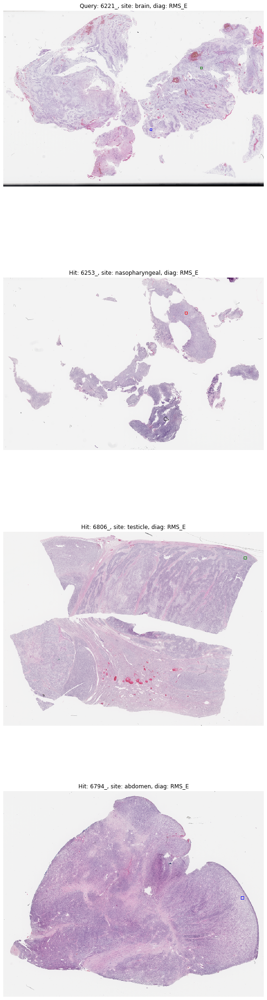

In [115]:
plot_matches(all_results, '6221_')

In [145]:
##Draw cooresponding patches
import matplotlib.patches as patches

def plot_matching_patches(all_results, slide_id, N = 5, thumb_dim = 1000, fig_scale = 10, plot_title = False):
            
    colors = ['red', 'green', 'blue', 'yellow', 'black']
    #Plot
    fig, axes = plt.subplots(N,2,figsize = (2*fig_scale, fig_scale*(N)))

    qs = openslide.OpenSlide(slide_path + slide_id + '.svs')
    
    #q_site = metadata.loc[metadata.slideid == slide_id, 'site'].values[0]
    q_diag = metadata.loc[metadata.slideid == slide_id, 'diagnosis'].values[0]
        
    for idx, (hit_slideid, hamming, hit_label, uncertainty, bag_idx, _, query_coords, hit_coords) in enumerate(all_results[slide_id][:N]):
        #print(idx)
        query_coords = query_coords
        #Get query patch
        q_im = qs.read_region(query_coords, 0, (1024, 1024))
        axes[idx, 0].imshow(q_im)
        axes[idx, 0].axis('off')
        if plot_title:
            axes[idx, 0].set_title(f"Query: {slide_id}, diag: {q_diag}")
        
        if hit_slideid[-2:] == '__':
            hs = openslide.OpenSlide(slide_path_all + hit_slideid[:-2] + '.svs')
        else:
            hs = openslide.OpenSlide(slide_path + hit_slideid + '.svs')
        hst = hs.read_region(hit_coords, 0, (1024, 1024))

        #h_site = metadata.loc[metadata.slideid == hit_slideid, 'site'].values[0]
        #h_diag = metadata.loc[metadata.slideid == hit_slideid, 'diagnosis'].values[0]

        axes[idx,1].imshow(hst)
        if plot_title:
            axes[idx,1].set_title(f"Hit: {hit_slideid}, diag: {hit_label}")
        axes[idx,1].axis('off')        


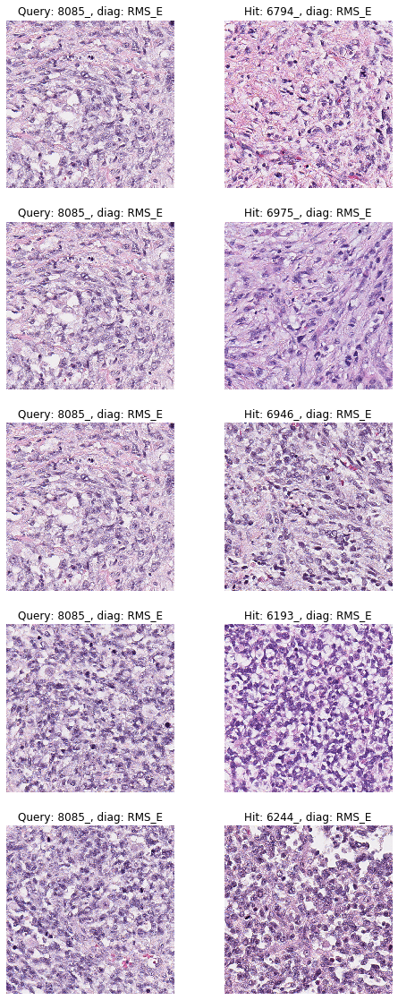

In [147]:
plot_matching_patches(all_results, '8085_', fig_scale = 4, plot_title = True)

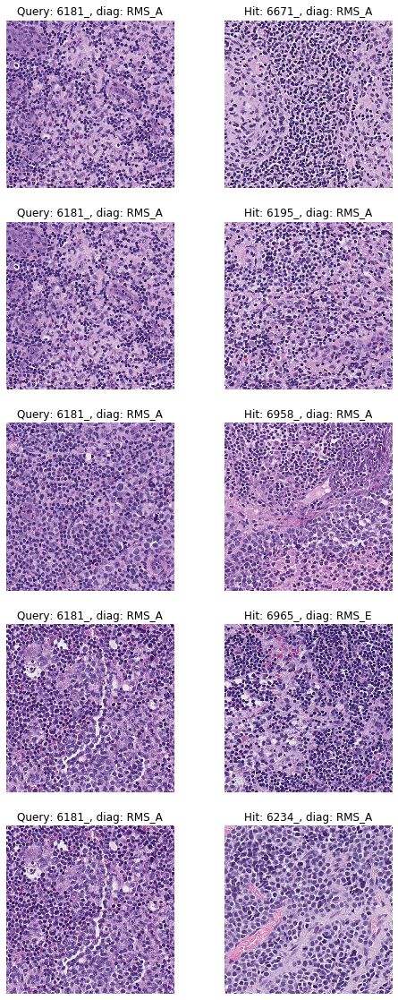

In [148]:
#6249_
plot_matching_patches(all_results, '6181_', fig_scale = 4, plot_title = True)

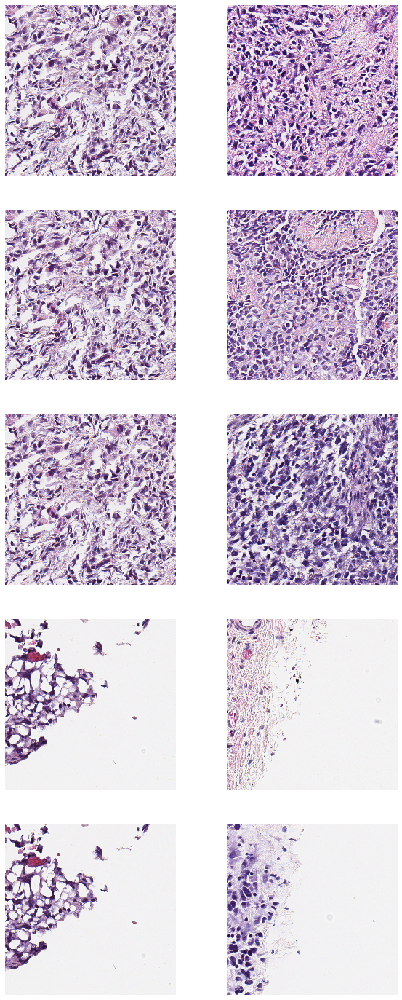

In [134]:
#6249_
plot_matching_patches(all_results, '6249_', fig_scale = 5)

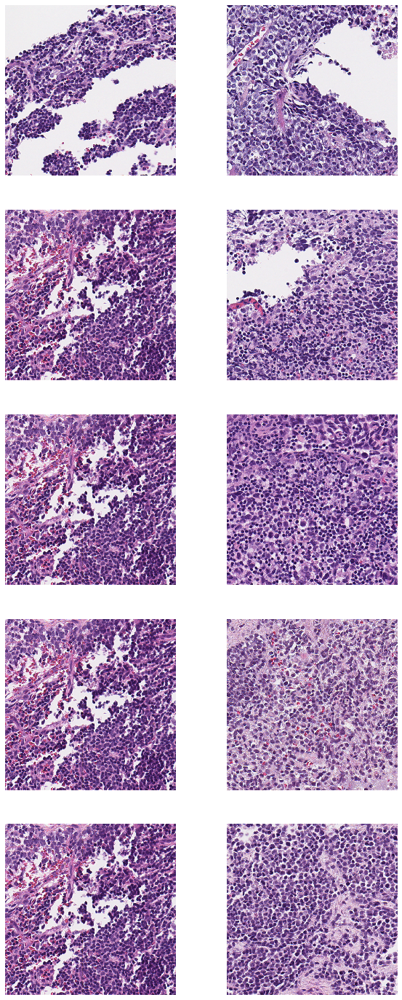

In [126]:
#6249_
plot_matching_patches(all_results, '6164_', fig_scale = 5)

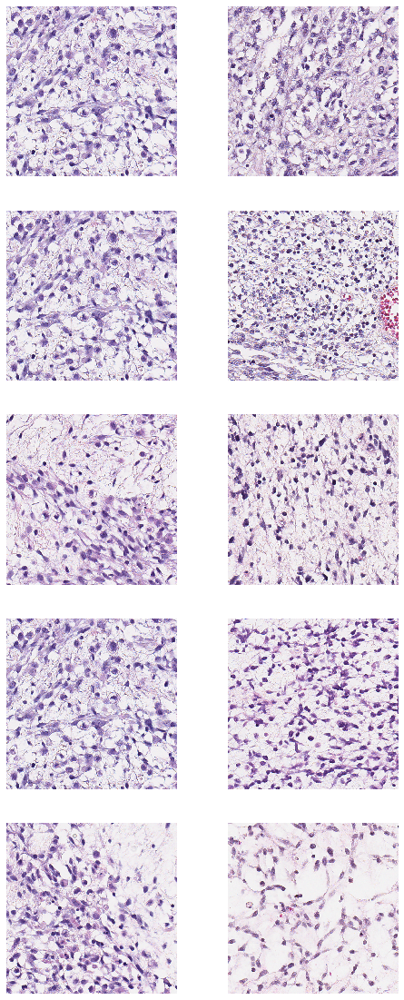

In [127]:
#6221_
plot_matching_patches(all_results, '6221_', fig_scale = 4)

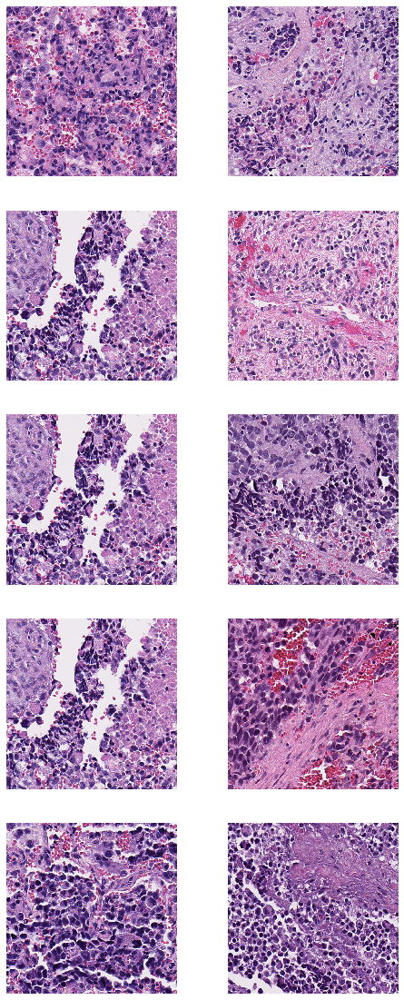

In [128]:
plot_matching_patches(all_results, '6808_', fig_scale = 4)

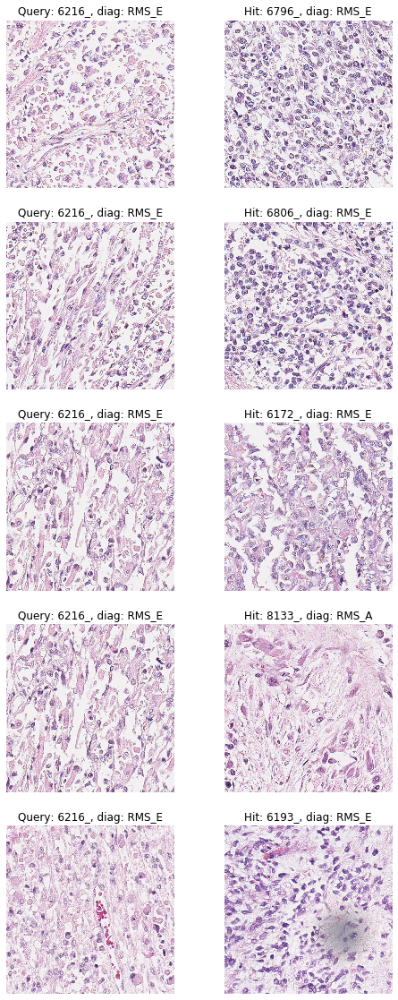

In [149]:
plot_matching_patches(all_results, '6216_', fig_scale = 4, plot_title = True)

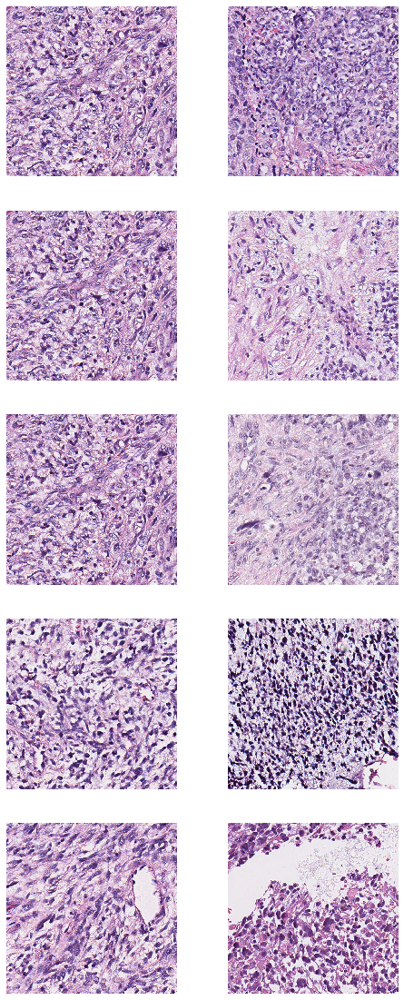

In [130]:
plot_matching_patches(all_results, '6794_', fig_scale = 4)